# Zero shot image segmentation with CLIPSeg

The **CLIPSeg model** was proposed in **Image Segmentation Using Text and Image Prompts** by Timo Lüddecke and Alexander Ecker.<br> CLIPSeg adds a minimal decoder on top of a frozen CLIP model for zero- and one-shot image segmentation.
<br><br>
<img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/blog/123_clipseg-zero-shot/clipseg-overview.png" width=640>


> https://huggingface.co/docs/transformers/model_doc/clipseg

## 1. Libraries

In [1]:
#!pip install -q transformers

In [3]:
import datetime
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import requests
import time
import torch
import urllib
import sys

from IPython.display import Image
from PIL import Image as PILImage

from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation

%matplotlib inline

In [4]:
print("Python version =", sys.version)

Python version = 3.8.5 (default, Sep  4 2020, 07:30:14) 
[GCC 7.3.0]


In [5]:
print("Today is:", datetime.datetime.today())

Today is: 2023-01-06 09:12:21.756198


In [6]:
IMAGES_DIR = "images"

os.makedirs(IMAGES_DIR, exist_ok=True)

## 2. Model

In [8]:
start = time.time()

processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained(
    "CIDAS/clipseg-rd64-refined")

print(f"Done in {(time.time() - start):.2f} secs")

Done in 3.13 secs


## 3. Testing

Input image: images/paris.jpg


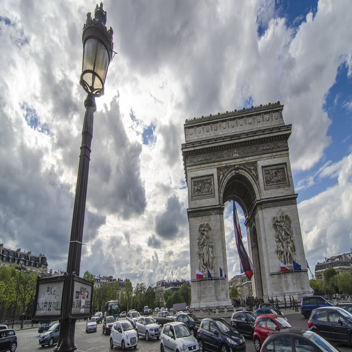

In [9]:
image_url = "https://github.com/retkowsky/Zero-shot-segmentation-with-CLIPSeg/raw/main/paris.jpg"

image_file = os.path.basename(image_url)
download_file = IMAGES_DIR + '/' + image_file
urllib.request.urlretrieve(image_url, filename=download_file)

# Resizing to be compatible with the mask size (352, 352)
img = PILImage.open(requests.get(image_url, stream=True).raw).resize(
    (352, 352))
img.save(download_file)
print("Input image:", download_file)
img

## 4. Objects segmentation to detect

In [10]:
objects = ["car", "red car", "flag", "blue sky", "tree", "building", "street lamp",
           "text", "cloud"]

for idx in range(len(objects)):
    print(idx+1, objects[idx])

1 car
2 red car
3 flag
4 blue sky
5 tree
6 building
7 street lamp
8 text
9 cloud


## 5. Running the predictions

In [12]:
start = time.time()

inputs = processor(text=objects,
                   images=[img] * len(objects),
                   padding="max_length",
                   return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

predictions = outputs.logits.unsqueeze(1)

print(f"Done in {(time.time() - start):.2f} secs")

Done in 1.54 secs


## 6. Results

In [13]:
def view_clipseg(idx):
    """
    View initial image + mask and save the mask into a jpg file
    """
    # Initial Image
    _, ax = plt.subplots(1, 2, figsize=(15, 7))
    [a.axis('off') for a in ax.flatten()]
    ax[0].imshow(img)

    # Mask
    [ax[0].text(0, -15, "Object = " + objects[idx], fontsize=15)]
    mask_img = torch.sigmoid(predictions[idx][0])
    ax[1].imshow(mask_img, cmap='gist_heat')

    # Saving mask
    output_file = IMAGES_DIR + "/" + os.path.splitext(image_file)[0] +\
    "_mask_" + str(objects[idx]) + ".jpg"
    output_img = transform_tensor_to_image(torch.sigmoid(predictions[idx][0]))
    output_img.save(output_file)

In [14]:
def transform_tensor_to_image(tensor):
    """
    Convert tensor to an image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)

    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]

    return PILImage.fromarray(tensor)

In [15]:
def view_mask_on_image(idx):
    """
    Display mask on the initial image
    """
    mask_red = PILImage.new(
        "RGBA",
        transform_tensor_to_image(torch.sigmoid(predictions[idx][0])).size,
        (255, 0, 0)
    )
    
    img_mask_red = PILImage.composite(
        mask_red, img,
        transform_tensor_to_image(torch.sigmoid(predictions[idx][0])))

    # Viewing mask on image
    _, ax = plt.subplots(1, 1, figsize=(15, 7))
    ax.axis('off')
    ax.text(10, 20, "Mask for object = " + objects[idx], fontsize=12, backgroundcolor="red")
    ax.imshow(img_mask_red)

    # Saving as a file
    output_file = IMAGES_DIR + "/" + os.path.splitext(image_file)[0]\
    + "_" + str(objects[idx]) + ".jpg"
    img_mask_red.save(output_file)

### Results

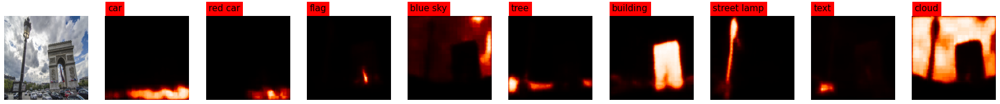

In [16]:
_, ax = plt.subplots(1, len(objects) + 1, figsize=(3 * (len(objects) + 1), 5))
[a.axis('off') for a in ax.flatten()]

ax[0].imshow(img)

[
    ax[i + 1].imshow(torch.sigmoid(predictions[i][0]), cmap="gist_heat")
    for i in range(len(objects))
]

[ax[i + 1].text(10, -20, text, fontsize=15, backgroundcolor="red") for i, text in enumerate(objects)];

### Segmentation results in one image

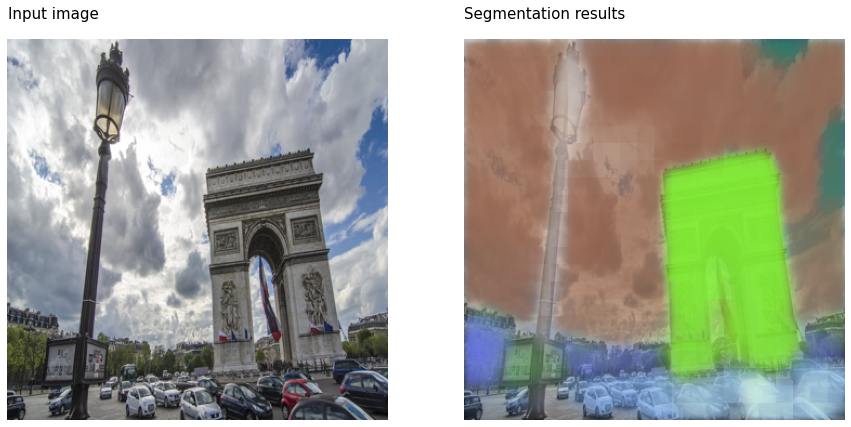

In [17]:
final_img = img

for idx in range(len(objects)):
    mask_red = PILImage.new(
        "RGBA",
        transform_tensor_to_image(torch.sigmoid(predictions[idx][0])).size,
        tuple(random.choices(range(256), k=3)))  # Random color for each mask

    final_img = PILImage.composite(
        mask_red,
        final_img,
        transform_tensor_to_image(torch.sigmoid(predictions[idx][0])))

output_file = IMAGES_DIR + '/' + os.path.splitext(image_file)[0]\
+ "_segmentation.jpg"

# viewing images
_, ax = plt.subplots(1, 2, figsize=(15, 15))
[a.axis('off') for a in ax.flatten()]
[ax[0].text(0, -20, "Input image", fontsize=15)];
[ax[1].text(0, -20, "Segmentation results", fontsize=15)];
ax[0].imshow(img)
ax[1].imshow(final_img)

# Saving into an image file
final_img.save(output_file)

### For each object

In [18]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

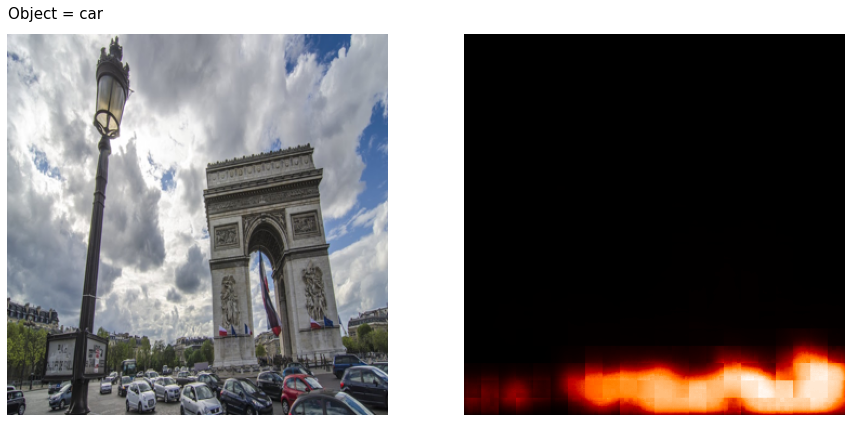

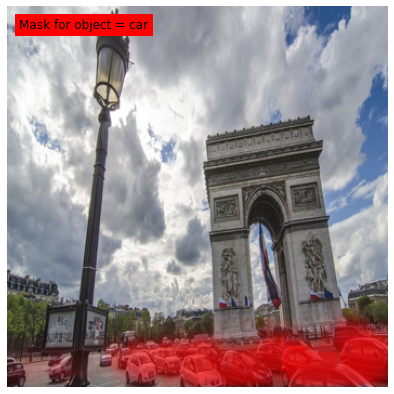

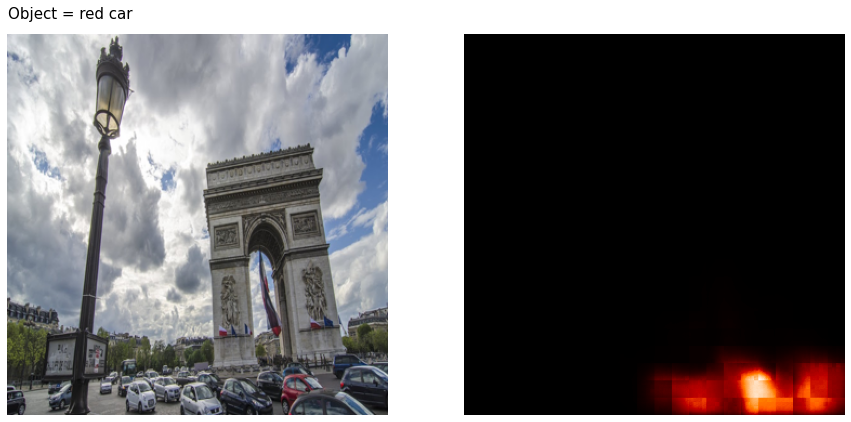

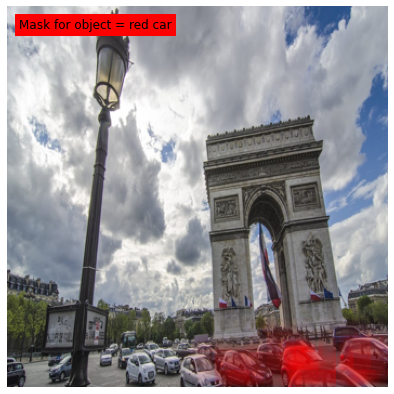

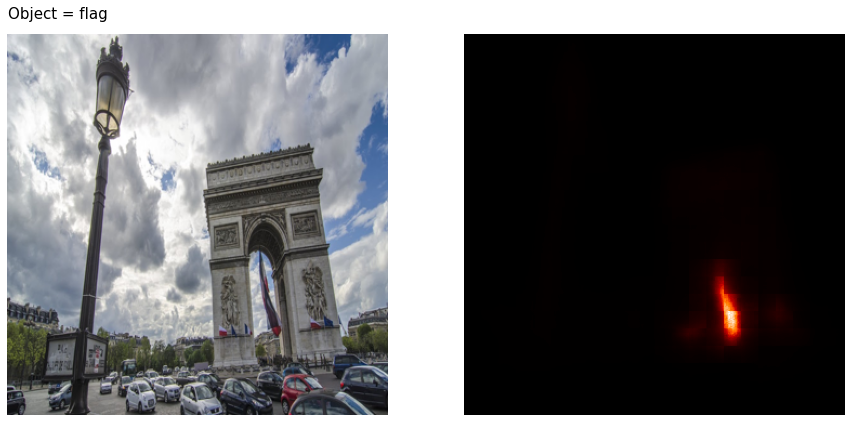

...

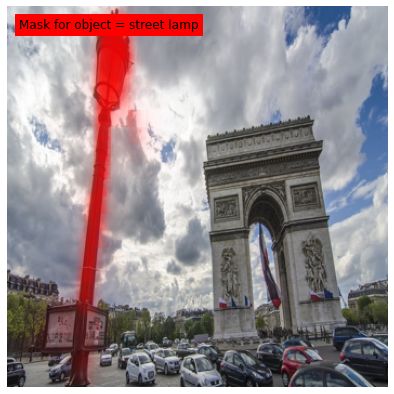

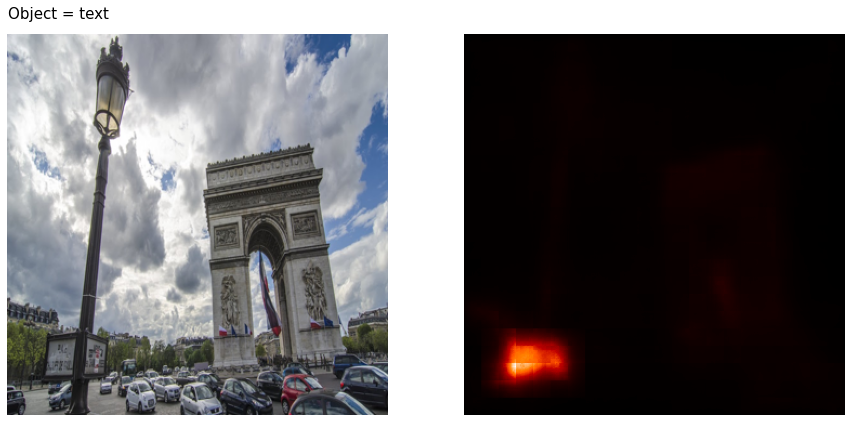

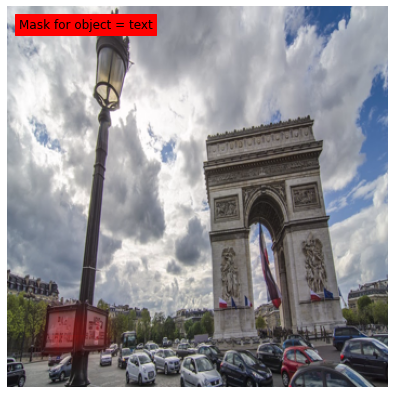

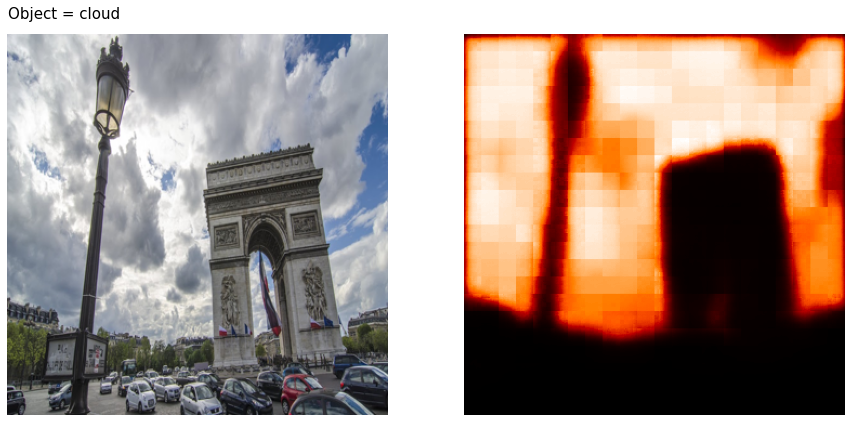

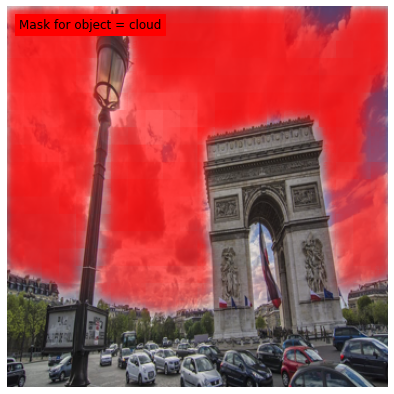

In [19]:
for idx in range(len(objects)):
    view_clipseg(idx)
    view_mask_on_image(idx)

### Images have been saved here:

In [20]:
images_list = [image for image in os.listdir(IMAGES_DIR) if image.endswith('jpg')]

print("Directory:", IMAGES_DIR, "\n")
for idx in range(len(images_list)):
    print(idx+1, images_list[idx])

Directory: images 

1 paris.jpg
2 paris_blue sky.jpg
3 paris_building.jpg
4 paris_car.jpg
5 paris_cloud.jpg
6 paris_flag.jpg
7 paris_mask_blue sky.jpg
8 paris_mask_building.jpg
9 paris_mask_car.jpg
10 paris_mask_cloud.jpg
11 paris_mask_flag.jpg
12 paris_mask_red car.jpg
13 paris_mask_street lamp.jpg
14 paris_mask_text.jpg
15 paris_mask_tree.jpg
16 paris_red car.jpg
17 paris_segmentation.jpg
18 paris_street lamp.jpg
19 paris_text.jpg
20 paris_tree.jpg


## 7. Using an image as a label

In [21]:
object_url = "https://github.com/retkowsky/Zero-shot-segmentation-with-CLIPSeg/raw/main/arc_triomphe.jpg"

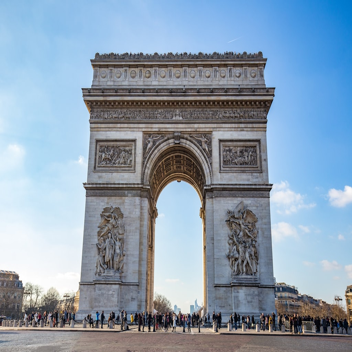

In [22]:
arc_de_triomphe = PILImage.open(requests.get(object_url, 
                                             stream=True).raw).resize((352, 352))

arc_de_triomphe

In [23]:
start = time.time()
encoded_image = processor(images=[img], return_tensors="pt")
encoded_prompt = processor(images=[arc_de_triomphe], return_tensors="pt")

with torch.no_grad():
    outputs = model(**encoded_image,
                    conditional_pixel_values=encoded_prompt.pixel_values)

preds = outputs.logits.unsqueeze(1)
preds = torch.transpose(preds, 0, 1)

print(f"Done in {(time.time() - start):.3f} secs")

Done in 0.642 secs


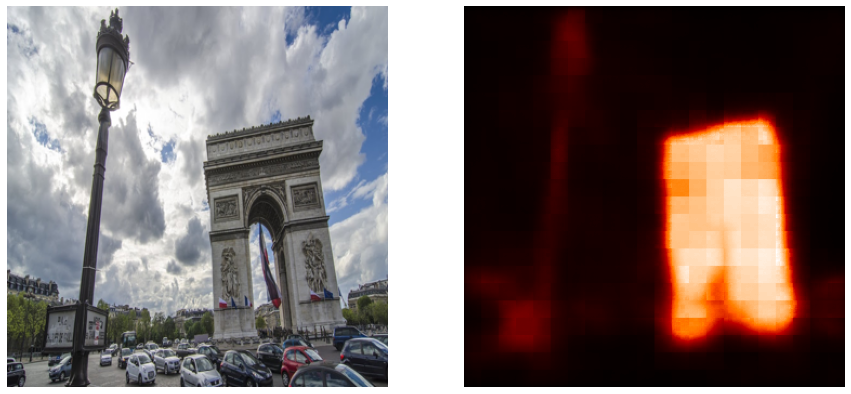

In [24]:
_, ax = plt.subplots(1, 2, figsize=(15, 7))

[a.axis('off') for a in ax.flatten()]
ax[0].imshow(img)
ax[1].imshow(torch.sigmoid(preds[0]), cmap="gist_heat");

In [25]:
object_url = "https://github.com/retkowsky/Zero-shot-segmentation-with-CLIPSeg/raw/main/street_lamp.jpg"

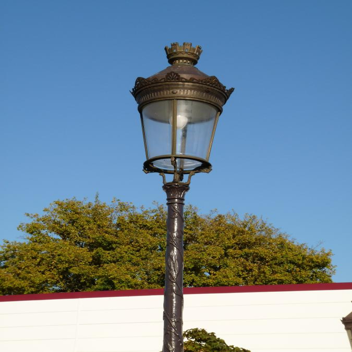

In [26]:
street_lamp = PILImage.open(requests.get(object_url, 
                                         stream=True).raw).resize((352, 352))

street_lamp

In [27]:
start = time.time()
encoded_image = processor(images=[img], return_tensors="pt")
encoded_prompt = processor(images=[street_lamp], return_tensors="pt")

with torch.no_grad():
    outputs = model(**encoded_image,
                    conditional_pixel_values=encoded_prompt.pixel_values)

preds = outputs.logits.unsqueeze(1)
preds = torch.transpose(preds, 0, 1)

print(f"Done in {(time.time() - start):.3f} secs")

Done in 0.475 secs


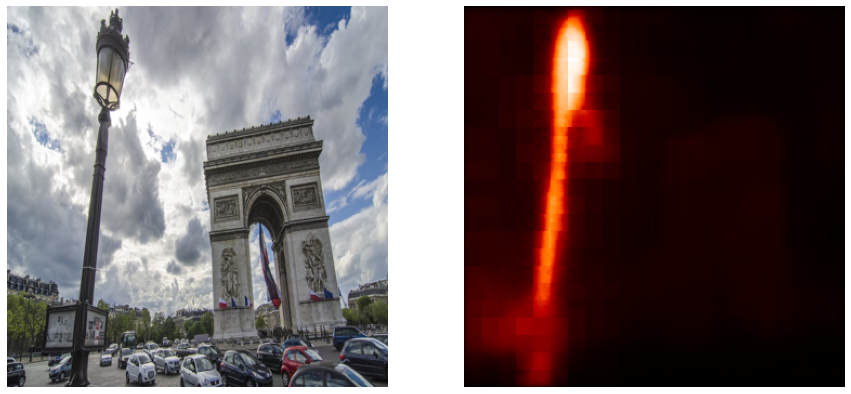

In [28]:
_, ax = plt.subplots(1, 2, figsize=(15, 7))

[a.axis("off") for a in ax.flatten()]
ax[0].imshow(img)
ax[1].imshow(torch.sigmoid(preds[0]), cmap="gist_heat");

## 8. Animated gif file

In [29]:
import imageio

print("Generating the animated GIF file...")
gif_file = "clipseg.gif"
images_list = []

images = [file for file in os.listdir(IMAGES_DIR)
          if file.endswith("jpg") and "_mask_" not in file]

for image in images:
    images_list.append(imageio.imread(IMAGES_DIR + "/" + image))
    imageio.mimsave(gif_file, images_list, duration = 1, fps = 60)

print("Done")

Generating the animated GIF file...
Done


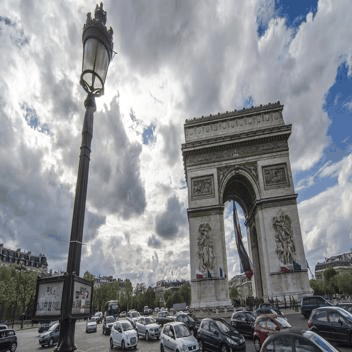

In [30]:
Image(filename=gif_file) 